***
# 1.3 Fine Labeling for Bird 22
### JX, 03/15/2022
***
    Bird22:
    LS110593.9.8.2018Araluen.WAV
    LS110640.10.1.2018Araluen.WAV
    
***

In [1]:
indv = "Bird22"

## Load up Note Dataframe

In [2]:
import pandas as pd
from pathlib2 import Path

from butcherbird.utils.paths import DATA_DIR

In [3]:
#SAVE_LOC = 'interim/recursive_labels/butcherbird_note_df_'+indv+'_recursive.pickle'
SAVE_LOC = 'interim/fine_labels/butcherbird_note_df_'+indv+'_fine.pickle'
SAVE_LOC = DATA_DIR / SAVE_LOC

In [4]:
note_df = pd.read_pickle(SAVE_LOC)

In [5]:
note_df.head()

,index,phrase_nb,phrase_strt,phrase_end,phrase_len,note_cnt,note_nb,note_strt,note_end,note_len,...,key,audio,rate,spectrogram,umap,hdbscan_labels,recur_labels,recur_labels_id,lasso_labels,seq_id
0,0,0,2.37,4.24,1.87,8,0,2.370000,2.415699,0.045699,...,LS110593.9.8.2018Araluen_dn,"[0.0, -5.558967174674641e-06, -5.2225732263302...",48000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[12.999457, -3.640876]",5,5|1|0|1.0|1.0|1.0|0.0|nan,113,29,0
1,1,0,2.37,4.24,1.87,8,1,2.660000,2.977558,0.317558,...,LS110593.9.8.2018Araluen_dn,"[0.0, 3.069944854750729e-05, 4.037410245845782...",48000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[14.162895, 10.566473]",19,19|1|0|0.0|0.0|nan|nan|nan,59,21,0
2,2,0,2.37,4.24,1.87,8,2,3.079714,3.173357,0.093643,...,LS110593.9.8.2018Araluen_dn,"[0.0, 0.0030796517861769505, 0.008741865222086...",48000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[5.823101, 11.083305]",19,19|1|1|0.0|0.0|0.0|nan|nan,63,23,0
3,3,0,2.37,4.24,1.87,8,3,3.260000,3.581982,0.321982,...,LS110593.9.8.2018Araluen_dn,"[-0.0, -0.00020854328852771913, -0.00037995893...",48000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[-3.8884213, 19.716284]",3,3|0|2|0.0|nan|nan|nan|nan,96,17,0
4,4,0,2.37,4.24,1.87,8,4,3.664275,3.718191,0.053916,...,LS110593.9.8.2018Araluen_dn,"[-0.0, -0.0018707999847079283, -0.003892325714...",48000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[4.6038485, 3.3076212]",7,7|1|0|0.0|0.0|nan|nan|nan,134,26,0


In [6]:
note_df['seq_id'] = note_df['phrase_nb']

## for each bout, built separate dataframe
seq_id = 0
note_dfs = []

for key in note_df['key'].unique():
    bout_df = note_df[note_df['key'] == key]
    bout_df['seq_id'] = bout_df['seq_id'] + seq_id
    seq_id = seq_id + max(bout_df.phrase_nb.values) + 1
    note_dfs.append(bout_df)
    
note_df = pd.concat(note_dfs).reset_index(drop = True)

/tmp/ipykernel_17514/3768216707.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bout_df['seq_id'] = bout_df['seq_id'] + seq_id


In [7]:
note_df

,index,phrase_nb,phrase_strt,phrase_end,phrase_len,note_cnt,note_nb,note_strt,note_end,note_len,...,key,audio,rate,spectrogram,umap,hdbscan_labels,recur_labels,recur_labels_id,lasso_labels,seq_id
0,0,0,2.370000,4.240000,1.870000,8,0,2.370000,2.415699,0.045699,...,LS110593.9.8.2018Araluen_dn,"[0.0, -5.558967174674641e-06, -5.2225732263302...",48000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[12.999457, -3.640876]",5,5|1|0|1.0|1.0|1.0|0.0|nan,113,29,0
1,1,0,2.370000,4.240000,1.870000,8,1,2.660000,2.977558,0.317558,...,LS110593.9.8.2018Araluen_dn,"[0.0, 3.069944854750729e-05, 4.037410245845782...",48000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[14.162895, 10.566473]",19,19|1|0|0.0|0.0|nan|nan|nan,59,21,0
2,2,0,2.370000,4.240000,1.870000,8,2,3.079714,3.173357,0.093643,...,LS110593.9.8.2018Araluen_dn,"[0.0, 0.0030796517861769505, 0.008741865222086...",48000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[5.823101, 11.083305]",19,19|1|1|0.0|0.0|0.0|nan|nan,63,23,0
3,3,0,2.370000,4.240000,1.870000,8,3,3.260000,3.581982,0.321982,...,LS110593.9.8.2018Araluen_dn,"[-0.0, -0.00020854328852771913, -0.00037995893...",48000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[-3.8884213, 19.716284]",3,3|0|2|0.0|nan|nan|nan|nan,96,17,0
4,4,0,2.370000,4.240000,1.870000,8,4,3.664275,3.718191,0.053916,...,LS110593.9.8.2018Araluen_dn,"[-0.0, -0.0018707999847079283, -0.003892325714...",48000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[4.6038485, 3.3076212]",7,7|1|0|0.0|0.0|nan|nan|nan,134,26,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3566,1077,216,7449.073765,7451.014733,1.940968,5,2,7449.909933,7450.602325,0.692392,...,LS110640.10.1.2018Araluen_dn,"[-0.0, -2.140440722621177e-07, -3.212511081611...",48000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[-6.6992188, 3.5407455]",12,12|1|0|0.0|nan|nan|nan|nan,18,4,647
3567,1078,216,7449.073765,7451.014733,1.940968,5,3,7450.606109,7450.790000,0.183891,...,LS110640.10.1.2018Araluen_dn,"[0.0, 6.060969809557767e-05, 0.000226911032359...",48000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[-6.1084714, 10.006679]",13,13|0|1|0.0|nan|nan|nan|nan,23,6,647
3568,1079,216,7449.073765,7451.014733,1.940968,5,4,7450.880000,7451.014733,0.134733,...,LS110640.10.1.2018Araluen_dn,"[-0.0, -0.0002617451218550637, -0.000495686777...",48000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[-0.7211057, 7.325408]",17,17|1|0|nan|nan|nan|nan|nan,50,8,647
3569,1080,217,7455.220000,7455.855543,0.635543,2,0,7455.220000,7455.440000,0.220000,...,LS110640.10.1.2018Araluen_dn,"[0.0, 4.403572842078721e-05, 6.391323052796741...",48000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[3.3330638, 15.063577]",21,21|0|0|0.0|0.0|nan|nan|nan,77,24,648


## Verification Chamber

In [8]:
from butcherbird.visualization.projections import scatter_spec
from butcherbird.visualization.note_barcodes import indv_barcode
import matplotlib.pyplot as plt
import numpy as np
from butcherbird.visualization.network_graph import plot_network_graph
import seaborn as sns
from IPython.display import SVG

Bird22 recur_labels_id [113  59  63  96 134  24  50  43  36  76  57 137 132  32 160 103  72  12
 115 173  55  25  23  81  73 159  16 117 170 108 162  78  82  77 118 133
 129  11  46 155  91  51 145 171  37  35  56  18 109 158  95 136  49 121
   5 131  66  29 123 142 111 167  64 125  47   4  13  45  74 147  20 169
  54  94  26 100   3  83  86  61  33  19   2  85  87 149  62   9  93 138
  71  42 122 124  60  10 156 154 139 153 150  88 166  98 152  15  41  17
  58  44  84  80  14 110 165   8 143   6 163  68  67 107 141 157  34 164
  65  99  38 161 102   0  22  21 101  28  90 140 116  40 126  75  89  79
 120 172   7   1  92  52 127 144  30 114  39 168 146 130  27 119 112 135
  53 148 128 106 151  48 104  69 105  31  70  97]


  0%|          | 0/431 [00:00<?, ?it/s]

  0%|          | 0/218 [00:00<?, ?it/s]

recur_labels_id


  0%|          | 0/649 [00:00<?, ?it/s]

/home/AD/j8xing/syntax_rhythm_pbb/butcherbird/visualization/network_graph.py:127: RuntimeWarning: invalid value encountered in true_divide
  transition_matrix = transition_matrix / np.sum(transition_matrix, axis=0)
/home/AD/j8xing/syntax_rhythm_pbb/butcherbird/visualization/network_graph.py:63: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  pos_locs = np.vstack(pos.values())


dict_keys([0, 12, 13, 14, 15, 16, 1, 2, 3, 41, 44, 4, 46, 5, 40, 66, 67, 6, 42, 43, 56, 7, 24, 69, 135, 154, 8, 27, 28, 29, 31, 45, 155, 9, 30, 68, 83, 156, 10, 11, 104, 17, 23, 84, 22, 143, 145, 148, 149, 151, 152, 49, 50, 51, 39, 25, 107, 26, 140, 34, 142, 146, 123, 32, 53, 74, 33, 73, 76, 57, 75, 35, 48, 82, 36, 78, 37, 85, 111, 113, 115, 38, 120, 47, 170, 141, 144, 153, 52, 54, 94, 95, 96, 98, 55, 97, 99, 137, 61, 126, 134, 136, 147, 150, 58, 131, 59, 63, 60, 62, 64, 65, 72, 121, 119, 122, 77, 81, 118, 79, 18, 80, 88, 21, 86, 87, 89, 139, 90, 138, 91, 92, 93, 124, 125, 127, 129, 128, 100, 133, 101, 71, 102, 103, 167, 168, 172, 105, 169, 106, 166, 108, 162, 163, 164, 109, 165, 171, 173, 110, 112, 114, 116, 117, 132, 130, 19, 20, 70, 157, 158, 159, 160, 161])


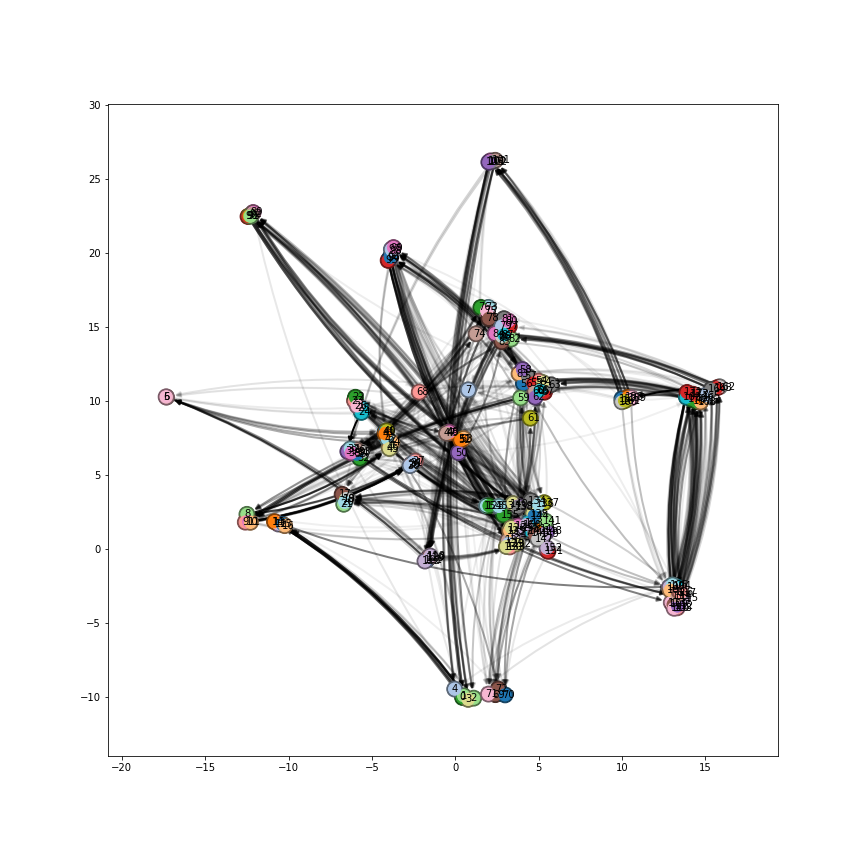

In [9]:
indv_dict = {}
indv_dict[indv] = {}

%matplotlib inline
for label in ['recur_labels_id']:
    ## print ID
    print(indv, label, note_df[label].unique())
    
    ## get info
    color_lists, trans_lists, label_pal_dict, label_pal, label_dict = indv_barcode(
        note_df,
        time_resolution=0.01,
        label=label,
        pal="tab20",
    )
    indv_dict[indv][label] = {
            "label_pal_dict": label_pal_dict,
            "label_dict": label_dict,
        }
%matplotlib widget
for label in ['recur_labels_id']:
    print(label)
    # plot graph
    elements = note_df[label].values
    projections = np.array(list(note_df['umap'].values))
    sequence_ids = np.array(note_df["seq_id"])
        
    label_pal_dict = indv_dict[indv][label]['label_pal_dict']
    label_dict = indv_dict[indv][label]['label_dict']
        
    pal_dict = {i:label_pal_dict[j] for i,j in label_dict.items()}
    fig, ax = plt.subplots(figsize=(12,12))
    plot_network_graph(
        elements, projections, sequence_ids, color_palette="tab20", ax=ax, pal_dict=pal_dict
    )
    plt.show()

## Lasso Station

In [10]:
%matplotlib widget
import butcherbird.label.semisupervised as semi
from butcherbird.label.lasso import SelectFromCollection
from butcherbird.label.semisupervised import sel_update

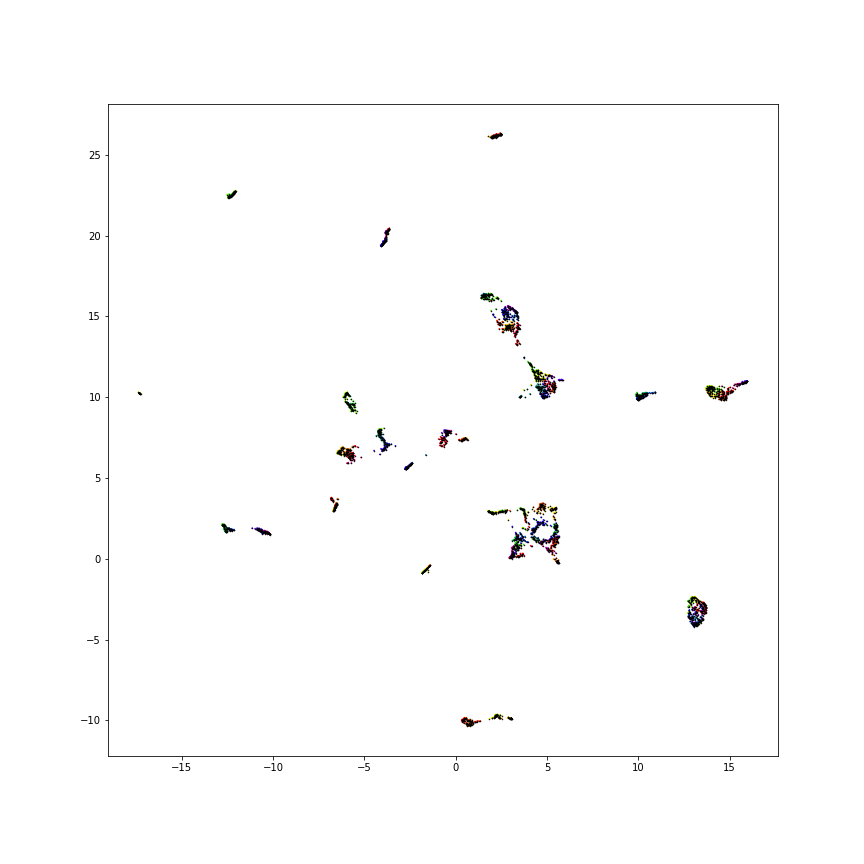

In [11]:
fig, ax = plt.subplots(figsize = (12, 12))
z = np.vstack(note_df.umap.values)
ax.scatter(z[:,0], z[:,1], c = note_df[label].values, s = 0.5, cmap = 'prism', alpha = 1)
## add selector
pts = ax.scatter(z[:, 0], z[:, 1], c = 'black', s = 0.25)
selector = SelectFromCollection(ax, pts, alpha_other=0)
    
fig.canvas.header_visible = False # Hide the Figure name at the top of the figure

plt.show() 

## Operating Theater

In [12]:
## Create New Label
note_df = semi.create_lasso(note_df, selector, label = label)

Nothing to Create


In [13]:
## MERGER
note_df = semi.merge_lasso(note_df, selector, label = label)

Nothing to Merge


In [14]:
## SPLITTER
note_df = semi.split_lasso(note_df, selector, label = label, stopping_cluster_size = 10)

Nothing to Split


## Rolling Verification

Bird22 lasso_labels [29 21 23 17 26  6 12 11 10  9 15 27 28  8 20 18 14  3 24 19 33  2 39 16
 13  5  1  7 38  0 36 25 31 22  4 37 32 35 34 30]


  0%|          | 0/431 [00:00<?, ?it/s]

  0%|          | 0/218 [00:00<?, ?it/s]

lasso_labels


  0%|          | 0/649 [00:00<?, ?it/s]

dict_keys([0, 3, 1, 10, 2, 7, 6, 8, 11, 12, 15, 38, 39, 4, 24, 9, 29, 13, 23, 27, 16, 25, 17, 26, 28, 18, 35, 19, 33, 20, 30, 21, 22, 36, 5, 32, 31, 14])


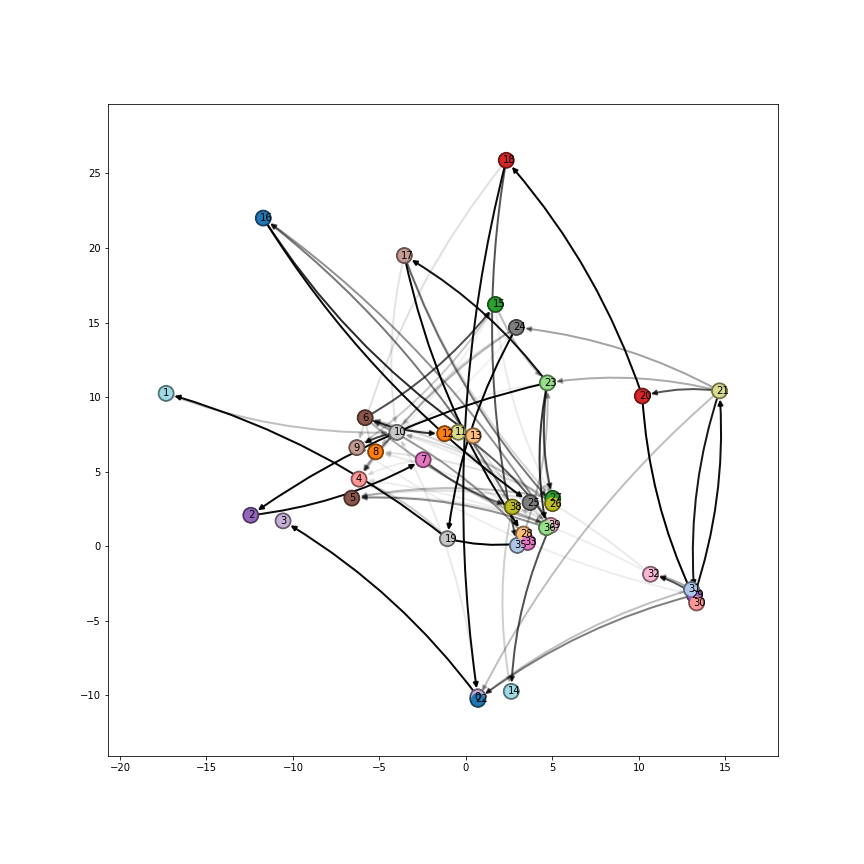

In [26]:
indv_dict = {}
indv_dict[indv] = {}

%matplotlib inline
for label in ['lasso_labels']:
    ## print ID
    print(indv, label, note_df[label].unique())
    
    ## get info
    color_lists, trans_lists, label_pal_dict, label_pal, label_dict = indv_barcode(
        note_df,
        time_resolution=0.01,
        label=label,
        pal="tab20",
    )
    indv_dict[indv][label] = {
            "label_pal_dict": label_pal_dict,
            "label_dict": label_dict,
        }
%matplotlib widget
for label in ['lasso_labels']:
    print(label)
    # plot graph
    elements = note_df[label].values
    projections = np.array(list(note_df['umap'].values))
    sequence_ids = np.array(note_df["seq_id"])
        
    label_pal_dict = indv_dict[indv][label]['label_pal_dict']
    label_dict = indv_dict[indv][label]['label_dict']
        
    pal_dict = {i:label_pal_dict[j] for i,j in label_dict.items()}
    fig, ax = plt.subplots(figsize=(12,12))
    plot_network_graph(
        elements, projections, sequence_ids, color_palette="tab20", ax=ax, pal_dict=pal_dict
    )
    plt.show()

In [24]:
# FINE LABEL MERGER
ids = [12341234, 123412341234]
note_df = semi.fine_merger(note_df, label = label, ids = ids)

Labels reserialized


In [27]:
# FINE LABEL MERGER
ids = [38, 39]
note_df = semi.fine_merger(note_df, label = 'lasso_labels', ids = ids)

For index # 81 , changed 38 to lasso_labels 38
For index # 168 , changed 38 to lasso_labels 38
For index # 171 , changed 38 to lasso_labels 38
For index # 257 , changed 38 to lasso_labels 38
For index # 304 , changed 38 to lasso_labels 38
For index # 361 , changed 38 to lasso_labels 38
For index # 367 , changed 38 to lasso_labels 38
For index # 391 , changed 38 to lasso_labels 38
For index # 527 , changed 38 to lasso_labels 38
For index # 607 , changed 38 to lasso_labels 38
For index # 731 , changed 38 to lasso_labels 38
For index # 853 , changed 38 to lasso_labels 38
For index # 906 , changed 38 to lasso_labels 38
For index # 1052 , changed 38 to lasso_labels 38
For index # 1105 , changed 38 to lasso_labels 38
For index # 1275 , changed 38 to lasso_labels 38
For index # 1277 , changed 38 to lasso_labels 38
For index # 1342 , changed 38 to lasso_labels 38
For index # 1362 , changed 38 to lasso_labels 38
For index # 1365 , changed 38 to lasso_labels 38
For index # 1406 , changed 38 to l

For index # 1971 , changed 39 to lasso_labels 38
For index # 1985 , changed 39 to lasso_labels 38
For index # 2025 , changed 39 to lasso_labels 38
For index # 2026 , changed 39 to lasso_labels 38
For index # 2071 , changed 39 to lasso_labels 38
For index # 2072 , changed 39 to lasso_labels 38
For index # 2120 , changed 39 to lasso_labels 38
For index # 2121 , changed 39 to lasso_labels 38
For index # 2139 , changed 39 to lasso_labels 38
For index # 2149 , changed 39 to lasso_labels 38
For index # 2150 , changed 39 to lasso_labels 38
For index # 2187 , changed 39 to lasso_labels 38
For index # 2204 , changed 39 to lasso_labels 38
For index # 2220 , changed 39 to lasso_labels 38
For index # 2221 , changed 39 to lasso_labels 38
For index # 2235 , changed 39 to lasso_labels 38
For index # 2258 , changed 39 to lasso_labels 38
For index # 2259 , changed 39 to lasso_labels 38
For index # 2283 , changed 39 to lasso_labels 38
For index # 2284 , changed 39 to lasso_labels 38
For index # 2316 , c

In [16]:
import numpy as np
import butcherbird.label.semisupervised as semi

In [1278]:
## FINE LABEL SPLITTER
ids = [29]
note_df = semi.fine_splitter(note_df, label = label, ids = ids, stopping_cluster_size = 25)

Start Recursive Cycle...

Layer 1


  0%|          | 0/1 [00:00<?, ?it/s]

[ Label 29 ], layer =  1

/Initiating Labeler Unit
//Pad Spectrograms to 99 mode: center


padding spectrograms:   0%|          | 0/336 [00:00<?, ?it/s]

Nearest Neighbor Count: 2
/Projecting to UMAP...
using regular
/Clustering with min_cluster_size = 25

Discovered 2 Clusters, potential subclusters discoverable in deeper layers


Start Recursive Cycle...

Layer 2


  0%|          | 0/2 [00:00<?, ?it/s]

[ Label 0 ], layer =  2

/Initiating Labeler Unit
//Pad Spectrograms to 76 mode: center


padding spectrograms:   0%|          | 0/89 [00:00<?, ?it/s]

Nearest Neighbor Count: 2
/Projecting to UMAP...
using regular
/Clustering with min_cluster_size = 25

Discovered 1 Cluster, No more subclusters are hidden


[ Label 1 ], layer =  2

/Initiating Labeler Unit
//Pad Spectrograms to 99 mode: center


padding spectrograms:   0%|          | 0/247 [00:00<?, ?it/s]

Nearest Neighbor Count: 2
/Projecting to UMAP...
using regular
/Clustering with min_cluster_size = 25

Discovered 1 Cluster, No more subclusters are hidden


For index # 47 , changed 29 to lasso_labels 41
For index # 50 , changed 29 to lasso_labels 41
For index # 81 , changed 29 to lasso_labels 40
For index # 84 , changed 29 to lasso_labels 41
For index # 144 , changed 29 to lasso_labels 41
For index # 168 , changed 29 to lasso_labels 40
For index # 171 , changed 29 to lasso_labels 40
For index # 211 , changed 29 to lasso_labels 41
For index # 226 , changed 29 to lasso_labels 41
For index # 229 , changed 29 to lasso_labels 41
For index # 257 , changed 29 to lasso_labels 40
For index # 260 , changed 29 to lasso_labels 41
For index # 304 , changed 29 to lasso_labels 40
For index # 361 , changed 29 to lasso_labels 40
For index # 367 , changed 29 to lasso_labels 40
For index # 391 , changed 29 to lasso_labels 40
For index # 394 , changed 29 to lasso_labels 41
For index # 479 , changed 29 t

Labels reserialized


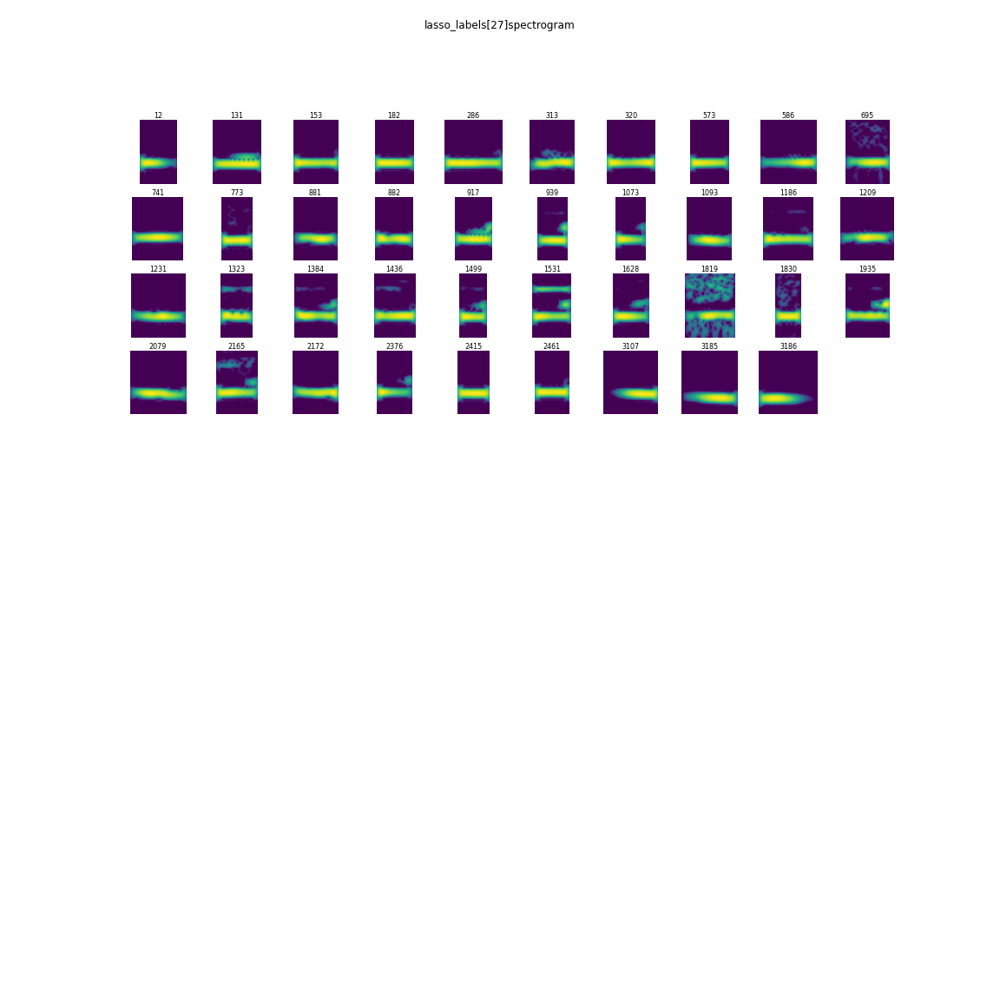

In [1181]:
semi.label_gallery(note_df, label = 27, method = 'lasso_labels', page = 0)

In [1286]:
## trashcan increment
index = [2991]
correct_label = 40

for ind in index:
    semi.label_rectifier(note_df, index = ind, correct_label = correct_label, label_type = 'lasso_labels', verbose = True)

For index # 2991 , changed 39 to lasso_labels 26


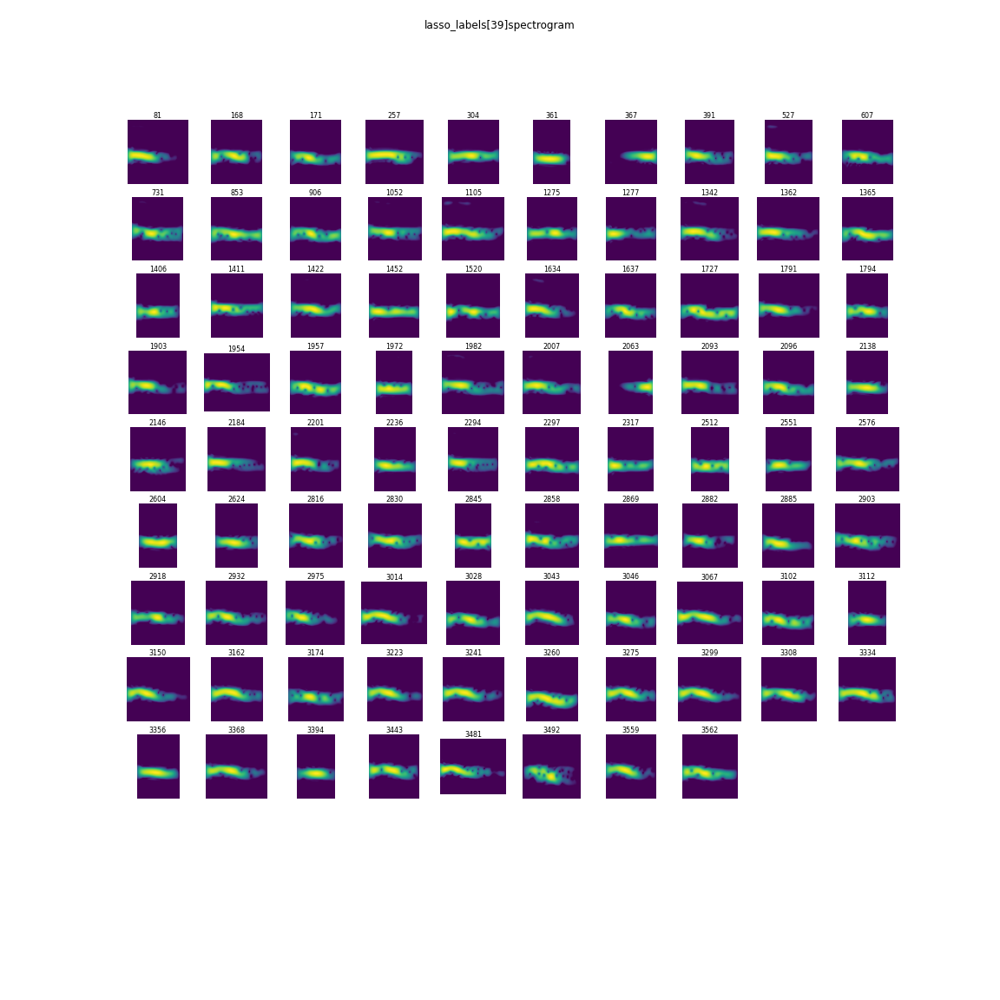

In [1288]:
semi.label_gallery(note_df, label = 39, method = 'lasso_labels', page = 0)

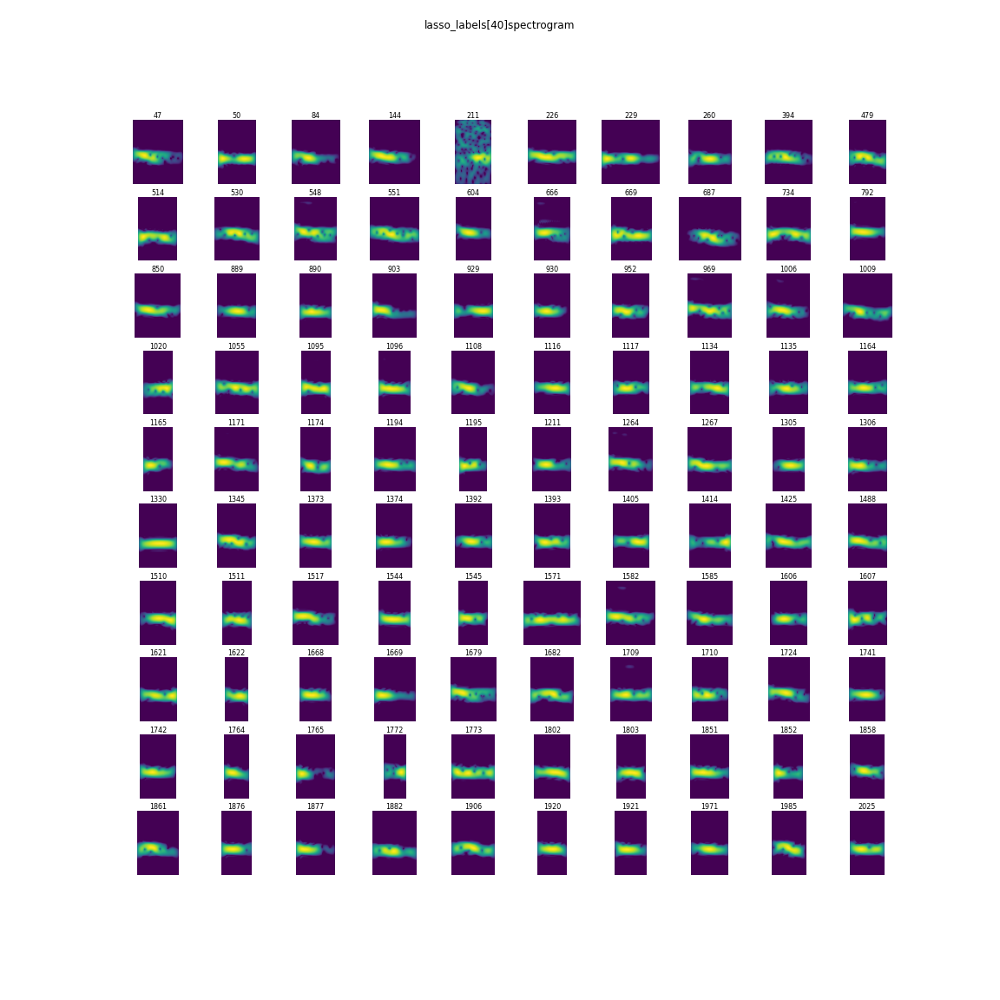

In [1287]:
semi.label_gallery(note_df, label = 40, method = 'lasso_labels', page = 0)

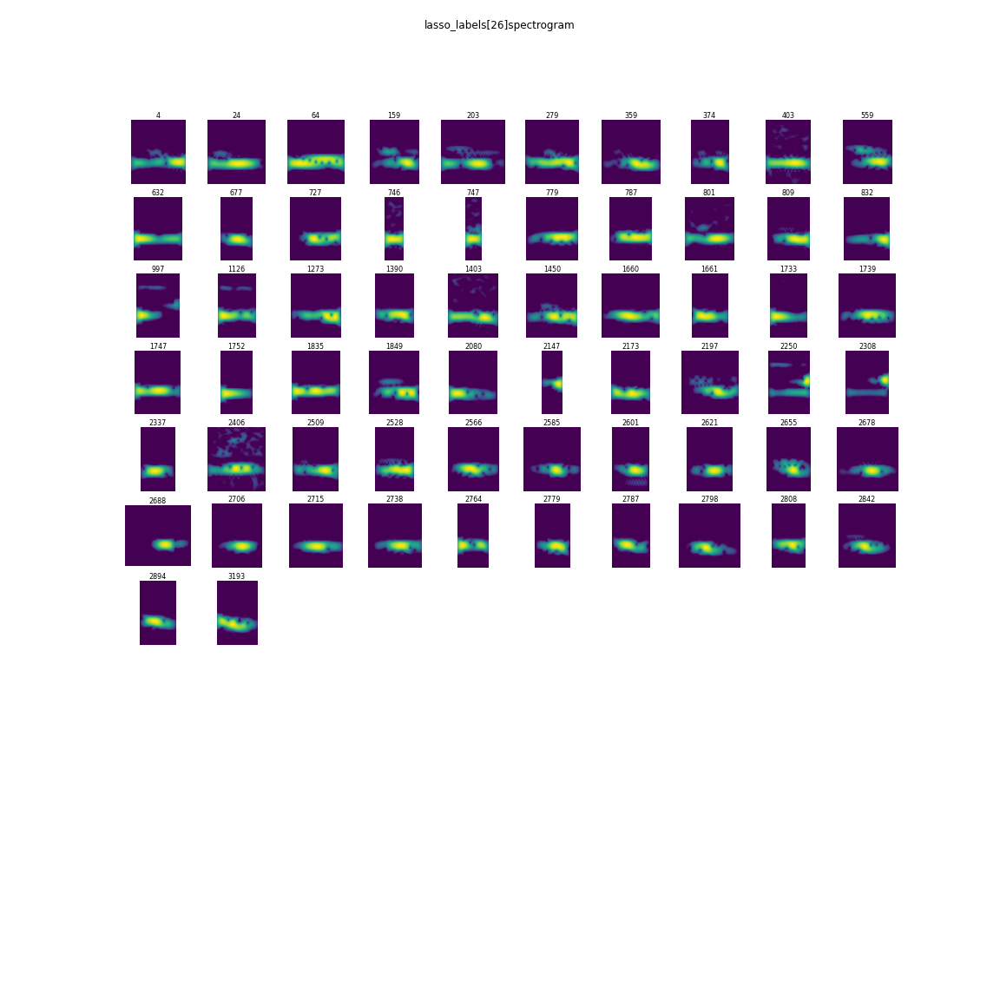

In [1215]:
semi.label_gallery(note_df, label = 26, method = 'lasso_labels', page = 0)

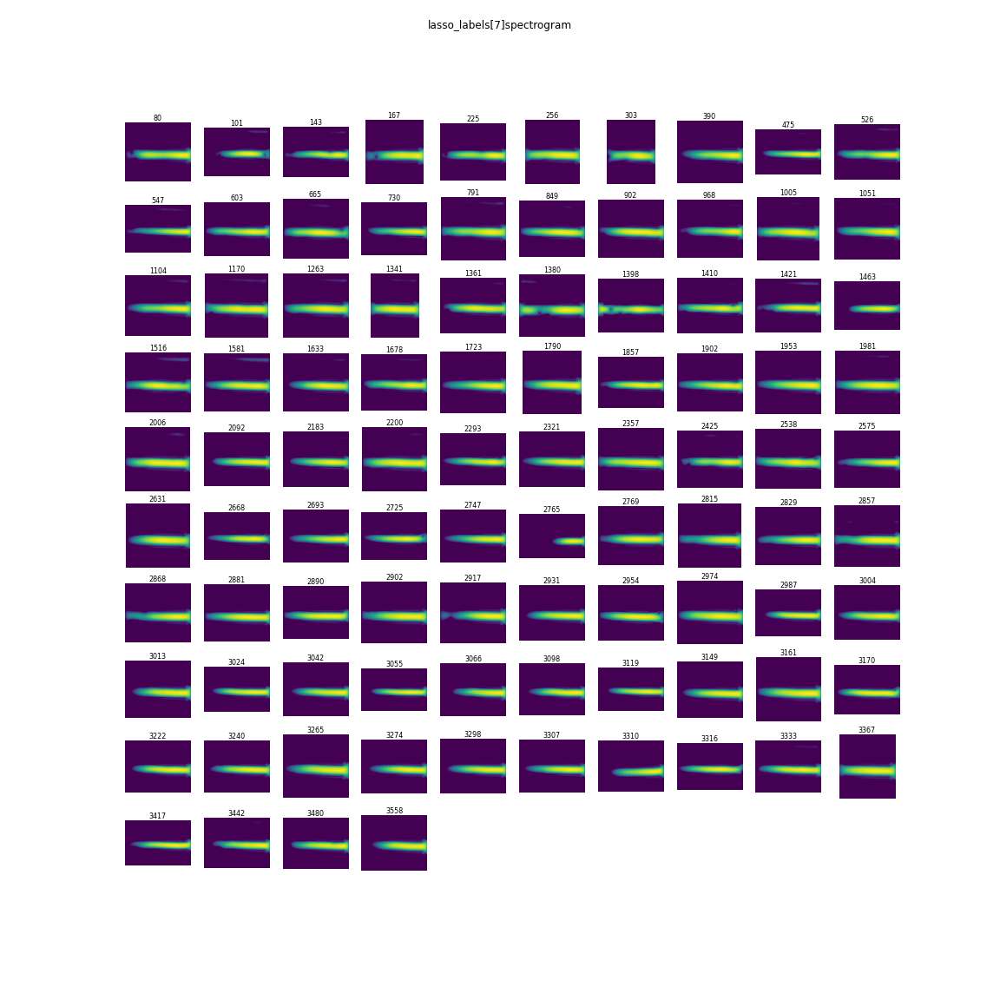

In [1073]:
semi.label_gallery(note_df, label = 7, method = 'lasso_labels', page = 0)

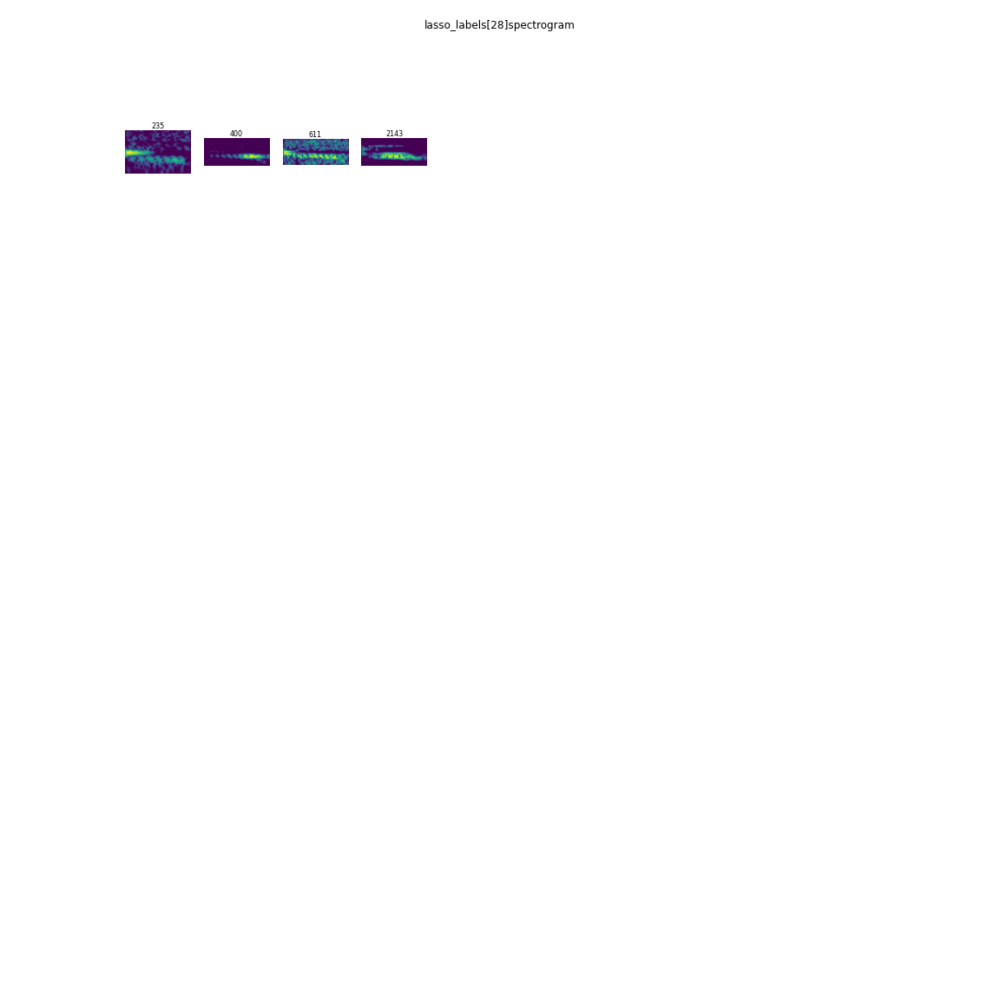

In [1017]:
semi.label_gallery(note_df, label = 28, method = 'lasso_labels', page = 0)

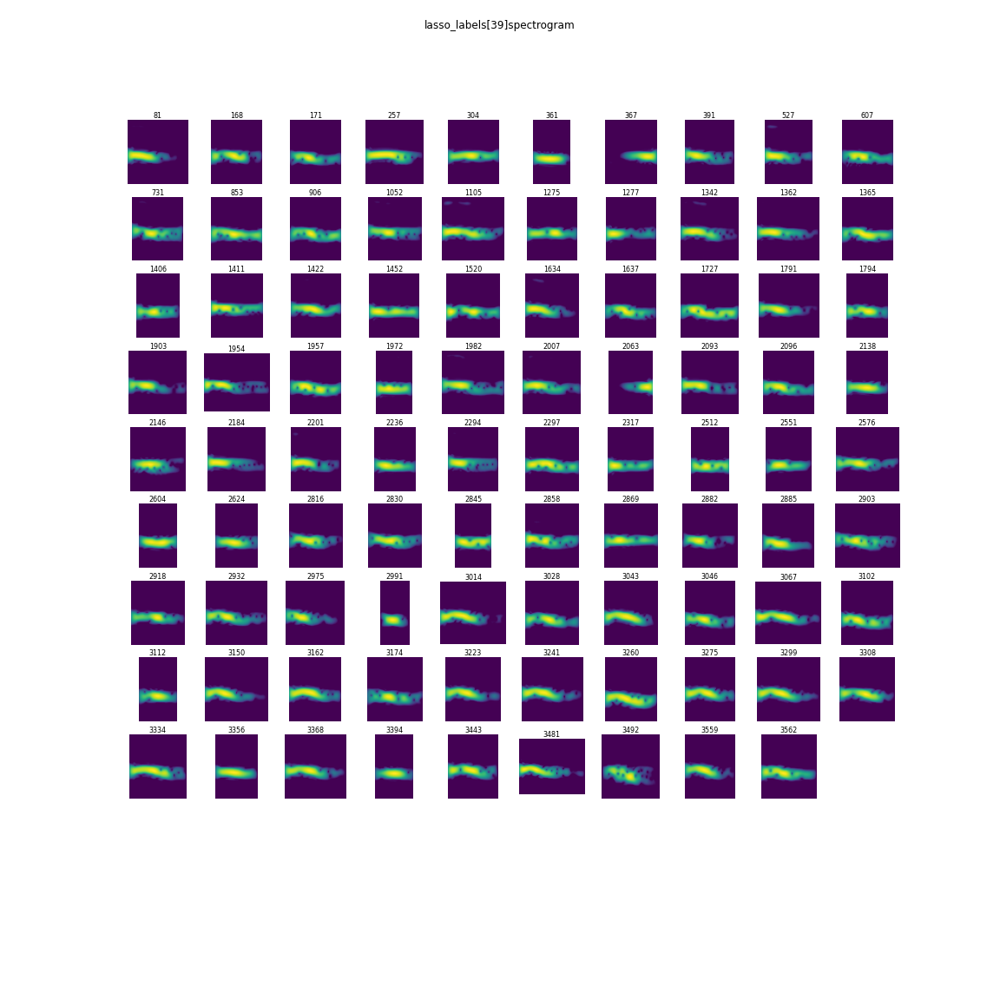

In [1283]:
semi.label_gallery(note_df, label = 39, method = 'lasso_labels', page = 0)

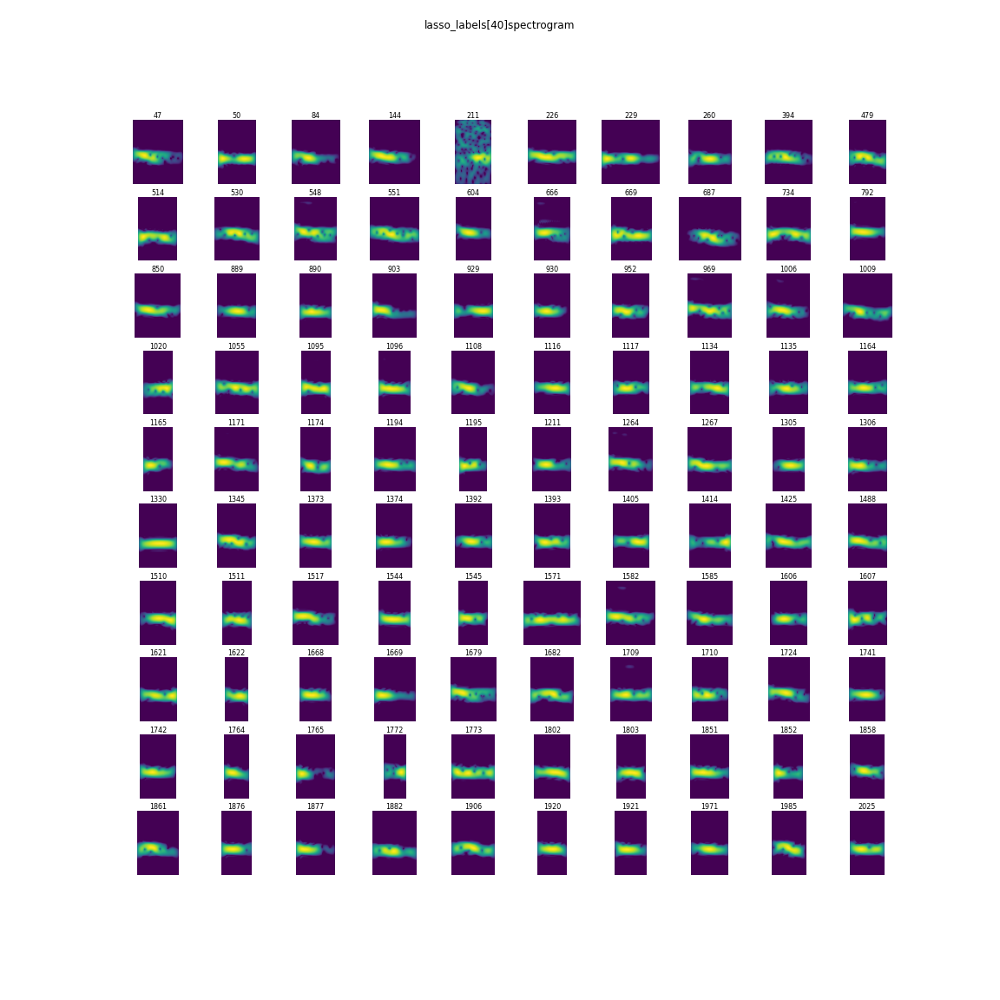

In [1284]:
semi.label_gallery(note_df, label = 40, method = 'lasso_labels', page = 0)

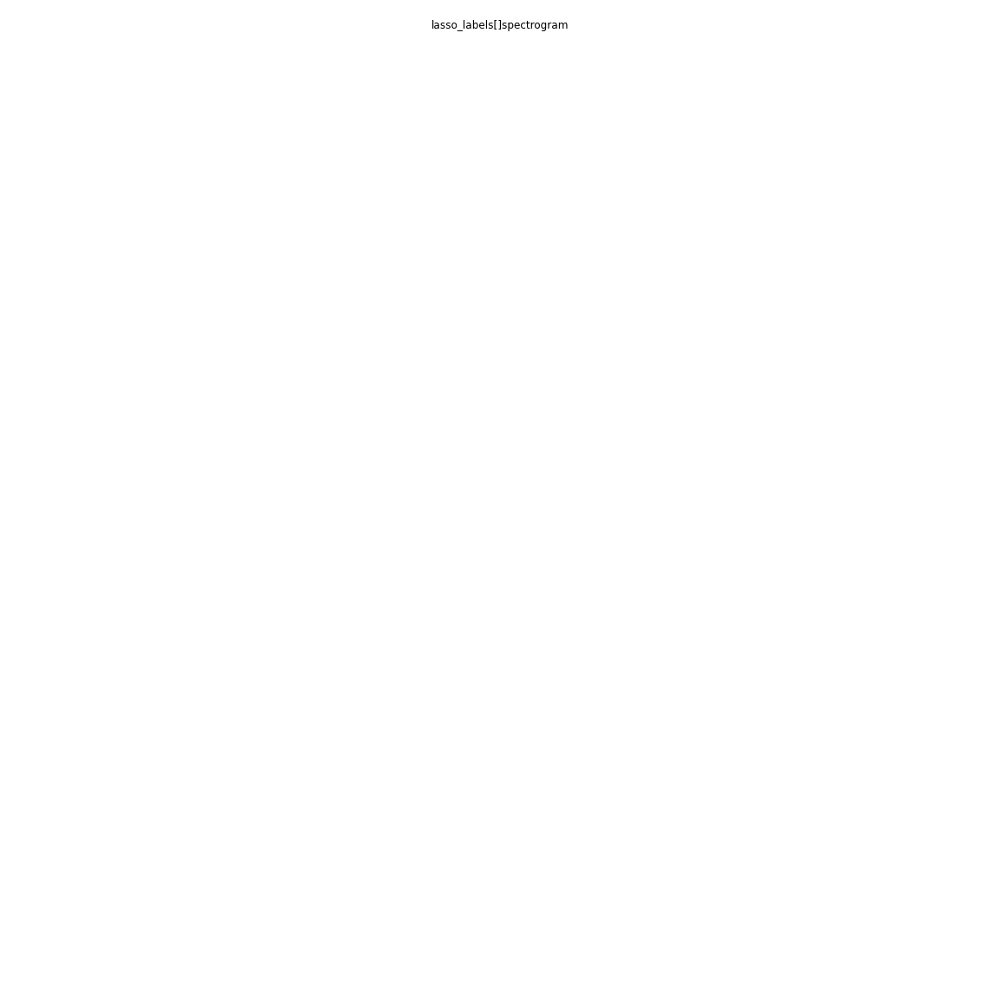

In [1281]:
semi.label_gallery(note_df, label = 41, method = 'lasso_labels', page = 0)

In [802]:
## rectifier
index = [300, ]
correct_label = 30234
for ind in index:
    semi.label_rectifier(note_df, index = ind, correct_label = correct_label, label_type = 'lasso_labels', verbose = True)

For index # 2501 , changed 48 to lasso_labels 30234
For index # 2700 , changed 48 to lasso_labels 30234
For index # 3473 , changed 48 to lasso_labels 30234


In [1259]:
## trashcan increment
index = [300]
correct_label = 600

for ind in index:
    semi.label_rectifier(note_df, index = ind, correct_label = correct_label, label_type = 'lasso_labels', verbose = True)

For index # 300 , changed 31 to lasso_labels 600


## Save 

In [1291]:
from butcherbird.utils.paths import DATA_DIR, ensure_dir
import pathlib2

In [1292]:
SAVE_LOC = 'interim/fine_labels/butcherbird_note_df_'+indv+'_fine.pickle'

In [1293]:
SAVE_LOC = DATA_DIR / SAVE_LOC

In [1294]:
ensure_dir(SAVE_LOC)

In [1295]:
note_df.to_pickle(SAVE_LOC)

## display all labels

In [19]:
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')
from tqdm.autonotebook import tqdm

/home/AD/j8xing/anaconda3/envs/pbb/lib/python3.10/site-packages/joblib/parallel.py:262: FutureWarning: Pass size=768 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  return [func(*args, **kwargs)
/home/AD/j8xing/anaconda3/envs/pbb/lib/python3.10/site-packages/joblib/parallel.py:262: FutureWarning: Pass size=768 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  return [func(*args, **kwargs)
/home/AD/j8xing/anaconda3/envs/pbb/lib/python3.10/site-packages/joblib/parallel.py:262: FutureWarning: Pass size=768 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  return [func(*args, **kwargs)
/home/AD/j8xing/anaconda3/envs/pbb/lib/python3.10/site-packages/joblib/parallel.py:262: FutureWarning: Pass size=768 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  return [func(*args, **kwargs)
/home/AD/j8xing/

/home/AD/j8xing/anaconda3/envs/pbb/lib/python3.10/site-packages/joblib/parallel.py:262: FutureWarning: Pass size=103 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  return [func(*args, **kwargs)
/home/AD/j8xing/anaconda3/envs/pbb/lib/python3.10/site-packages/joblib/parallel.py:262: FutureWarning: Pass size=103 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  return [func(*args, **kwargs)
/home/AD/j8xing/anaconda3/envs/pbb/lib/python3.10/site-packages/joblib/parallel.py:262: FutureWarning: Pass size=103 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  return [func(*args, **kwargs)
/home/AD/j8xing/anaconda3/envs/pbb/lib/python3.10/site-packages/joblib/parallel.py:262: FutureWarning: Pass size=103 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  return [func(*args, **kwargs)
/home/AD/j8xing/

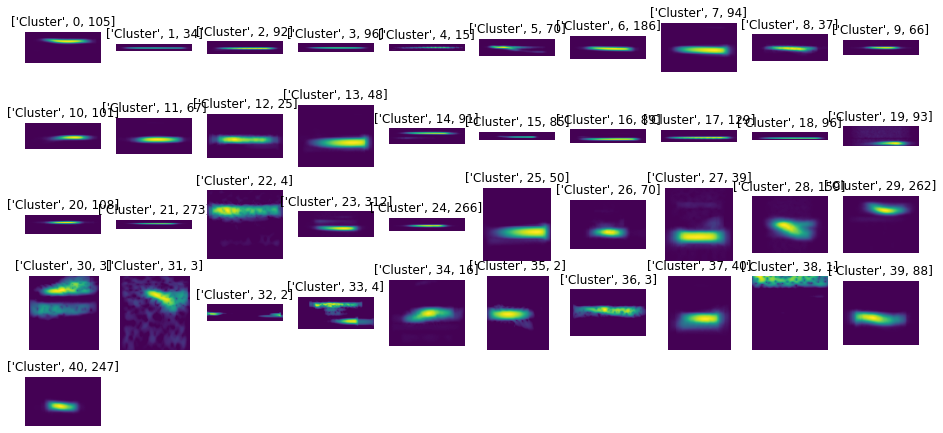

In [20]:
%matplotlib inline
semi.label_prototypes(note_df, dim = [10, 10], method = 'lasso_labels', display = 'spectrogram')

  0%|          | 0/100 [00:00<?, ?it/s]

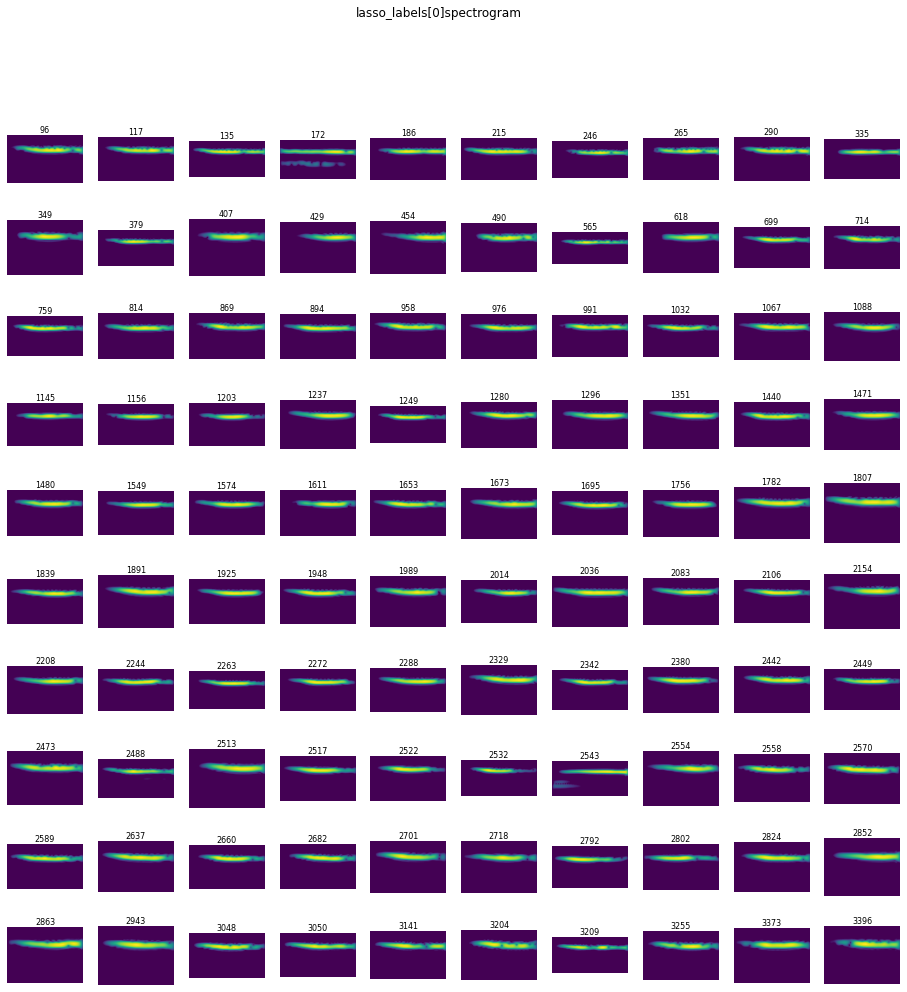

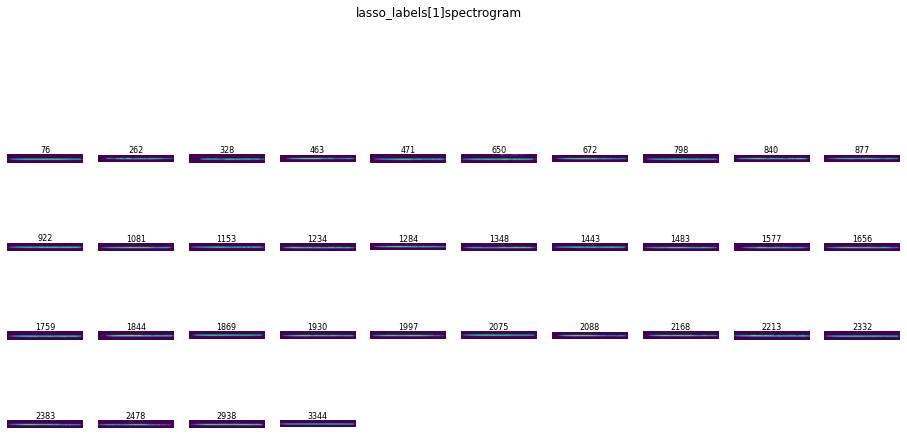

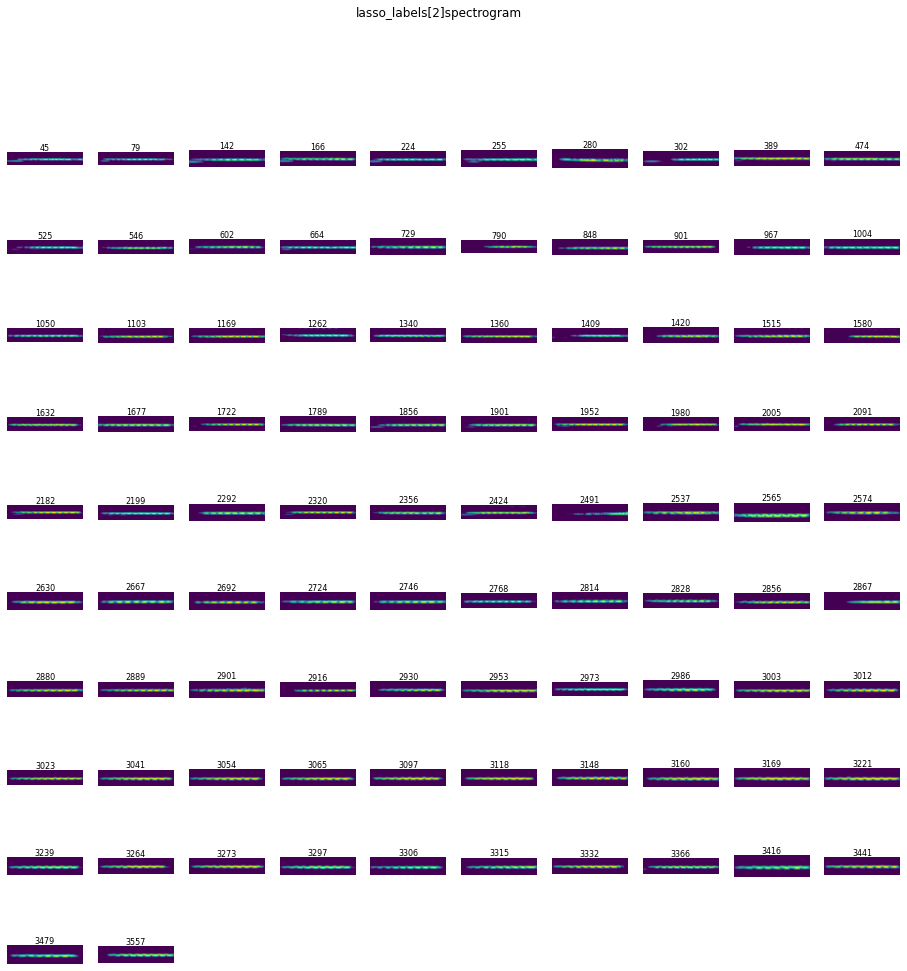

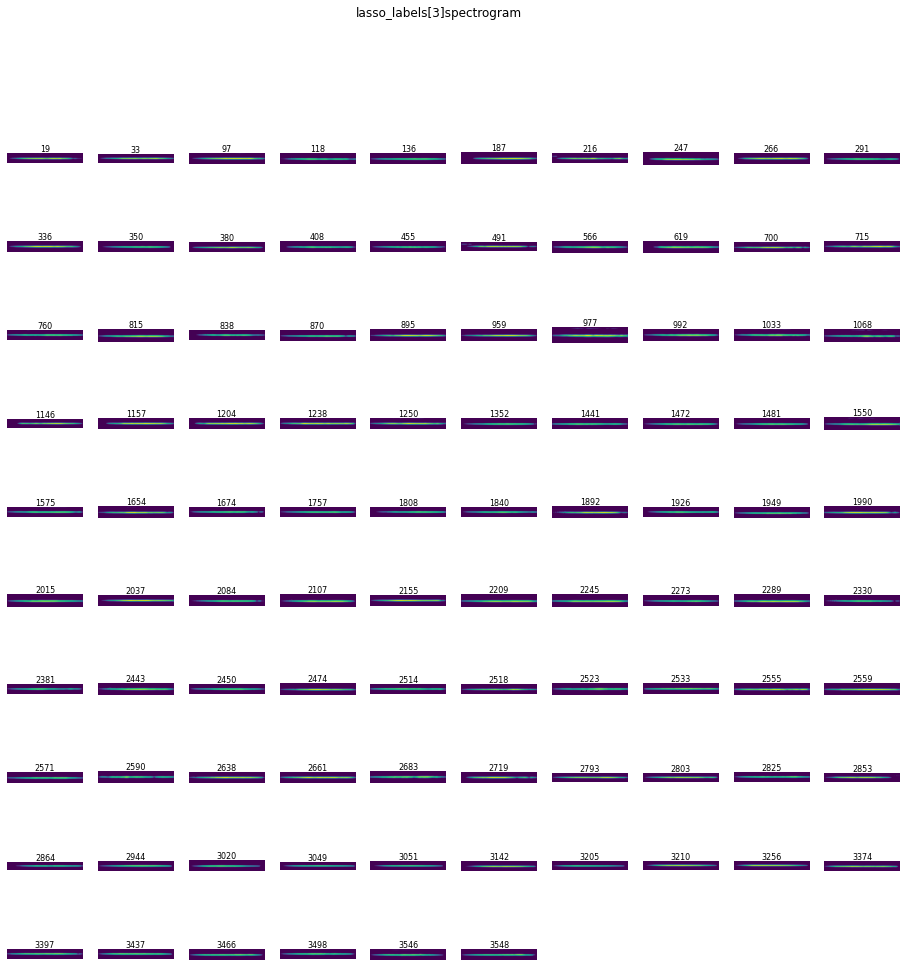

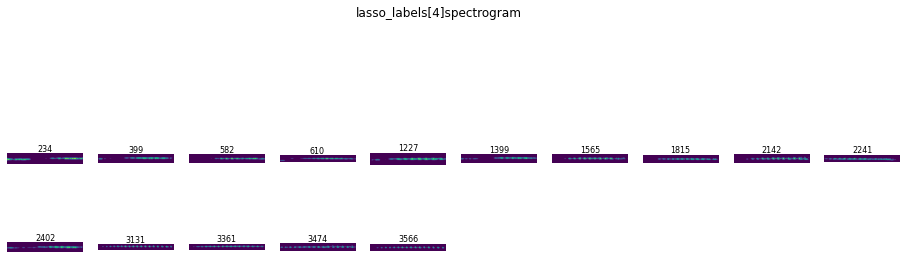

...

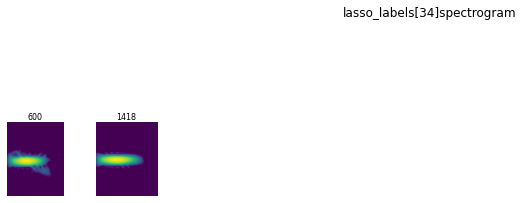

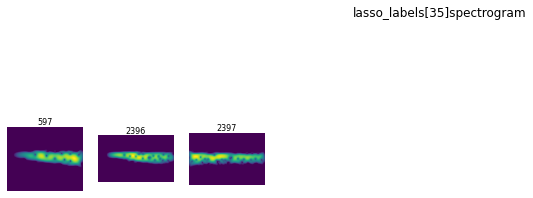

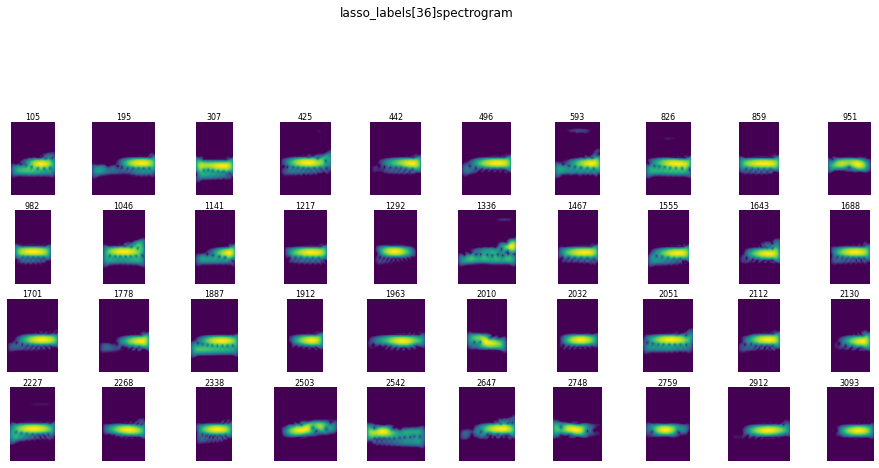

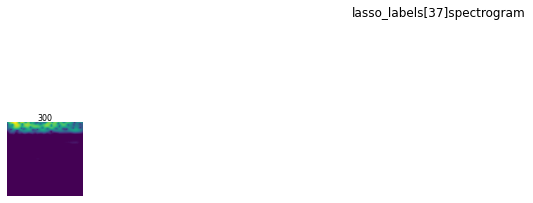

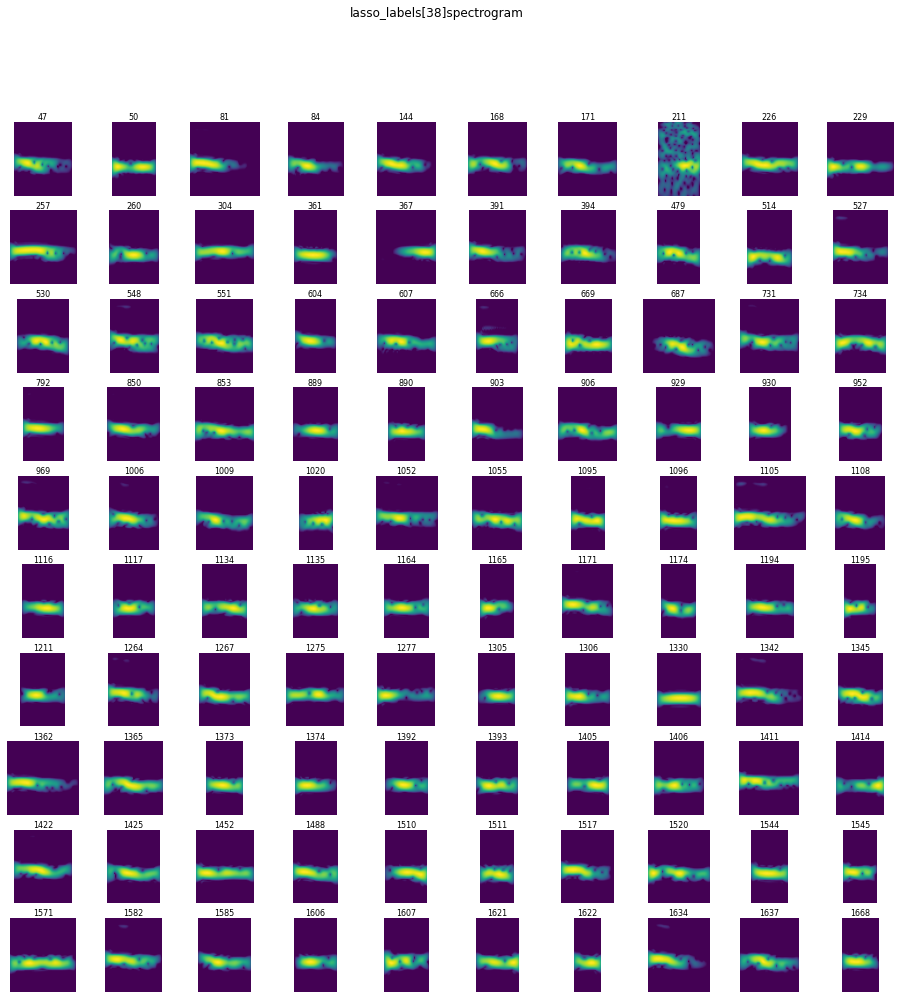

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

In [28]:
%matplotlib inline
for label in tqdm(np.arange(0, 100)):
    semi.label_gallery(note_df, label = label, method = 'lasso_labels', page = 0)